In [21]:
import pandas as pd
nifty50_data = pd.read_csv("nifty50_closing_prices.csv")
nifty50_data.head()

,Date,RELIANCE.NS,HDFCBANK.NS,ICICIBANK.NS,INFY.NS,TCS.NS,KOTAKBANK.NS,HINDUNILVR.NS,ITC.NS,LT.NS,...,HEROMOTOCO.NS,DRREDDY.NS,SHREECEM.NS,BRITANNIA.NS,UPL.NS,EICHERMOT.NS,SBILIFE.NS,ADANIPORTS.NS,BAJAJ-AUTO.NS,HINDALCO.NS
0,2024-08-20 00:00:00+05:30,2991.899902,1637.699951,1179.449951,1872.199951,4523.299805,1805.650024,2751.050049,498.799988,3572.699951,...,5244.399902,6965.350098,24730.550781,5765.799805,566.150024,4883.250000,1761.300049,1492.550049,9779.700195,672.900024
1,2024-08-21 00:00:00+05:30,2997.350098,1625.800049,1174.849976,1872.699951,4551.500000,1812.949951,2791.199951,505.399994,3596.050049,...,5284.700195,7062.450195,24808.050781,5837.350098,568.299988,4913.549805,1800.599976,1503.500000,9852.000000,685.599976
2,2024-08-22 00:00:00+05:30,2996.250000,1631.300049,1191.099976,1880.250000,4502.000000,1821.500000,2792.800049,504.549988,3606.500000,...,5329.950195,6969.049805,25012.400391,5836.799805,579.150024,4933.549805,1795.250000,1492.300049,9914.200195,685.549988
3,2024-08-23 00:00:00+05:30,2999.949951,1625.050049,1203.500000,1862.099976,4463.899902,1818.000000,2815.600098,505.799988,3598.550049,...,5384.899902,6954.500000,24706.050781,5792.649902,573.700012,4898.100098,1789.300049,1491.300049,10406.450195,685.099976
4,2024-08-26 00:00:00+05:30,3025.199951,1639.949951,1213.300049,1876.150024,4502.450195,1812.500000,2821.149902,505.700012,3641.899902,...,5343.750000,6943.299805,24906.449219,5796.950195,577.450012,4875.200195,1796.250000,1482.550049,10432.549805,711.849976


In [23]:
# check for missing values
missing_values = nifty50_data.isnull().sum()
#.isnull() =This checks if any value is missing
#.sum() = This adds up the number of missing values column-wise.

#check for date column format
date_format_check = pd.to_datetime(nifty50_data['Date'],errors='coerce').notna().all()
#errors='coerce' If there's a value that cannot be converted to a date turn it into NAT instead of giving an error.
#.notna() Check which values are not missing
#.all() it checks that all values are True or not.

# check if the data has sufficient rows for time-series analysis
sufficient_rows = nifty50_data.shape[0] >= 20 #Minimum rows needed for rolling/moving averages
#.shape tells you the size of your table

# preparing a summary of the checks
data_preparation_status = {
    "Missing Values in Columns": missing_values[missing_values > 0].to_dict(), #Converts that filtered Series into a Python dictionary.
    "Date Column Format Valid": date_format_check,
    "Sufficient Rows for Time-Series Analysis": sufficient_rows
}
data_preparation_status

{'Missing Values in Columns': {'HDFC.NS': 24},
 'Date Column Format Valid': True,
 'Sufficient Rows for Time-Series Analysis': True}

In [25]:
#The output indicates the following about the dataset:
#Missing Values: The HDFC.NS column has 24 missing values, meaning it is empty and requires removal or imputation.
#Date Column Validity: The Date column is in a valid datetime format, which ensures it can be used for time-series analysis.
#Sufficient Rows: The dataset contains enough rows to perform time-series calculations like moving averages and other analyses.

In [27]:
#Now, let’s prepare the data:
# drop the HDFC.NS column since it contains 100% missing values
nifty50_data = nifty50_data.drop(columns=['HDFC.NS'])
# convert the 'Date' column to datetime format
nifty50_data['Date'] = pd.to_datetime(nifty50_data['Date'])
# sort the dataset by date to ensure proper time-series order
nifty50_data = nifty50_data.sort_values(by='Date')
# reset index for a clean dataframe
nifty50_data.reset_index(drop=True, inplace=True)
#drop = “Don’t keep the old index as a column — just throw it away.”
#inplace = “Make the change directly in nifty50_data instead of creating a copy.”

In [29]:
# Now let's look at the descriptive statistics
# calculate descriptive statistics
descriptive_stats = nifty50_data.describe().T #Transpose for better readability
descriptive_stats = descriptive_stats[['mean','std','min','max']]
descriptive_stats.columns = ['Mean', 'Std Dev', 'Min', 'Max'] #.columns is a property in Pandas that stores the names of the columns in a Datafram.
print(descriptive_stats)

                       Mean     Std Dev           Min           Max
RELIANCE.NS     2976.912506   41.290551   2903.000000   3041.850098
HDFCBANK.NS     1652.339579   28.258220   1625.050049   1741.199951
ICICIBANK.NS    1236.770818   36.438726   1174.849976   1338.449951
INFY.NS         1914.558324   30.240685   1862.099976   1964.500000
TCS.NS          4478.349976   70.822718   4284.899902   4553.750000
KOTAKBANK.NS    1809.422918   32.936318   1764.150024   1904.500000
HINDUNILVR.NS   2845.333344   65.620694   2751.050049   2977.600098
ITC.NS           507.739581    5.472559    497.299988    519.500000
LT.NS           3647.099976   60.511574   3536.949951   3793.899902
SBIN.NS          802.233332   17.442330    768.599976    824.799988
BAJFINANCE.NS   7203.118754  306.658594   6722.200195   7631.100098
BHARTIARTL.NS   1572.574997   67.346274   1449.150024   1711.750000
HCLTECH.NS      1753.743744   46.874886   1661.449951   1813.750000
ASIANPAINT.NS   3231.654175   88.793647   3103.1

In [31]:
#Portfolio Analysis
#the process of evaluating the performance of a collection of financial assets (a portfolio) to understand its returns, risks, and overall behaviour.
# It helps investors optimize asset allocation to achieve specific financial goals.

# assign weights to a subset of stocks (example: RELIANCE.NS, HDFCBANK.NS, ICICIBANK.NS)
Weights = [0.4, 0.35,0.25]
portfolio_data = nifty50_data[['RELIANCE.NS', 'HDFCBANK.NS', 'ICICIBANK.NS']] 
#weights → A variable name that will store a list of numbers.
#[0.4, 0.35, 0.25] → This is a Python list containing three values.
#These numbers represent portfolio weights — the proportion of money invested in each stock.

# calculate daily returns
daily_returns = portfolio_data.pct_change().dropna()
#pct_change() is a Pandas function that calculates the percentage change from one row to the next.
#The first row will always be NaN because there’s no previous day to compare to.
#.dropna() removes any rows that have NaN values.

# calculate portfolio returns
portfolio_returns = (daily_returns * Weights).sum(axis=1)
#(axis=1)This adds up the weighted returns for all three stocks on each day.

# display portfolio returns
portfolio_returns.head()
#So, in the above code, we:
#Selected three stocks (RELIANCE, HDFCBANK, ICICIBANK) to form a portfolio.
#Assigned weights of 40%, 35%, and 25%, which represent the proportion of investment in each stock.
#Computed the percentage change in daily prices for each stock.
#Calculated weighted daily portfolio returns by multiplying individual stock returns by their respective weights and summing them.

1   -0.002790
2    0.004495
3    0.001756
4    0.008612
5   -0.000994
dtype: float64

In [33]:
# In the output, each value represents the percentage change in the portfolio’s value for a particular day. 
# For example, a return of -0.002790 on the first day indicates a 0.279% decrease in the portfolio’s value, while 0.004495 on the second day indicates a 0.4495% increase.
# These values help in tracking the portfolio’s daily performance over time.

In [35]:
# Risk Assessment
# Risk Assessment is the process of evaluating the potential risks in an investment,
# such as price volatility and potential losses, to help investors make informed decisions.

# Calculate standard deviation (volatility)
volatility = daily_returns.std()

# Calculate VaR (95% confidence level)
confidence_level = 0.05
VaR = daily_returns.quantile(confidence_level) #confidence_level = 0.05 → we are looking at the worst 5% of daily returns 

# Display risk metrics
risk_metrics = pd.DataFrame({'volatility (std Dev)': volatility, 'Value at Risk (VaR)': VaR})
print(risk_metrics) #Volatility (Std Dev) → From daily_returns.std(), shows how much each stock’s daily returns fluctuate.
#Value at Risk (VaR) → From daily_returns.quantile(0.05), shows the 5% worst-case daily loss threshold.

#To perform risk assessment, we:
#Calculated the standard deviation of daily returns for each stock, to measure how much the stock prices fluctuate.
#Computed the 5th percentile (95% confidence level) of daily returns, to estimate the maximum loss the portfolio could experience on a bad day.


              volatility (std Dev)  Value at Risk (VaR)
RELIANCE.NS               0.008708            -0.013624
HDFCBANK.NS               0.006901            -0.005987
ICICIBANK.NS              0.011594            -0.008577


In [37]:
#Volatility (Std Dev): RELIANCE has a volatility of 0.87%, HDFCBANK has 0.69%, and ICICIBANK has 1.16%. This indicates that ICICIBANK has the highest price fluctuations, while HDFCBANK is the least volatile.
#Value at Risk (VaR): At a 95% confidence level, RELIANCE has a maximum potential daily loss of 1.36%, HDFCBANK has 0.60%, and ICICIBANK has 0.86%. These values indicate the risk of loss for each stock in a single day under normal market conditions.


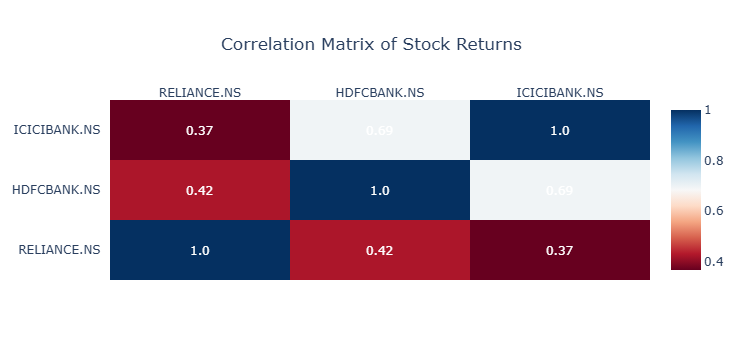

In [41]:
#Correlation Analysis
#Correlation Analysis examines the relationship between the returns of different assets to determine how they move relative to each other.
# A positive correlation indicates that the assets tend to move in the same direction, while a negative correlation means they move in opposite directions. 

import plotly.figure_factory as ff
#import plotly.figure_factory as ff is just importing Plotly’s figure factory module, which is a set of helper functions for making specialized plots that aren’t included in the basic plotly.graph_objects or plotly.express tools.

# Calculate correlation matrix
correlation_matrix = daily_returns.corr()

# Create annotated heatmap
fig = ff.create_annotated_heatmap(
    z=correlation_matrix.values, # z is the 2D array of values you want to visualize
    x=list(correlation_matrix.columns), # x labels the columns of the heatmap.
    y=list(correlation_matrix.index), # y labels the rows of the heatmap.
    annotation_text=correlation_matrix.round(2).values, # This sets the text that appears inside each heatmap cell.
    colorscale='RdBu', #This defines the color theme of the heatmap.
    showscale=True #
)

# Update layout
fig.update_layout(
    title="Correlation Matrix of Stock Returns",
    title_x=0.5,
    font=dict(size=12),
    plot_bgcolor='white',
    paper_bgcolor='white',
)

# Show figure
fig.show()

#So, in the above code, we:

#Calculated the pairwise correlation coefficients for the daily returns of the selected stocks, to show the strength and direction of their relationships.
#Used a heatmap to visually represent the correlations, with colour intensities indicating the strength of the relationships.

In [43]:
#The correlation matrix shows the relationships between the daily returns of three stocks:

#RELIANCE and HDFCBANK have a moderate positive correlation of 0.42, indicating they often move in the same direction but not perfectly.
#ICICIBANK and HDFCBANK have a higher correlation of 0.69, suggesting stronger co-movement.
#RELIANCE and ICICIBANK have a lower correlation of 0.37, indicating relatively weaker alignment.

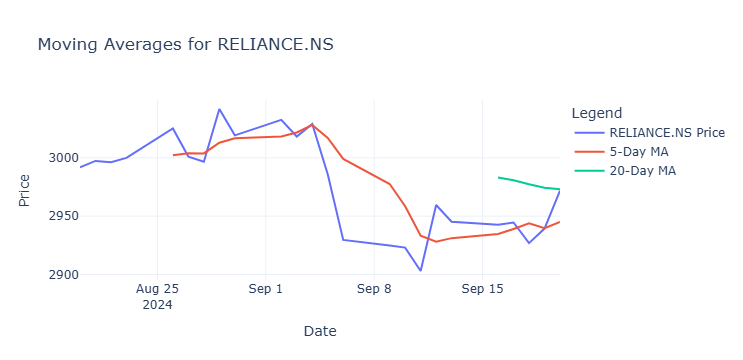

In [45]:
# Moving Averages
# Moving Averages are a technical analysis tool that smooths out price data by calculating the average price over a specific period.
# They help identify trends by reducing short-term fluctuations in stock prices.

import plotly.graph_objects as go

# calculate moving averages for RELIANCE
nifty50_data['RELIANCE_5d_MA'] = nifty50_data['RELIANCE.NS'].rolling(window=5).mean() # Adds a new column 'RELIANCE_5d_MA' containing the 5-day moving average.
nifty50_data['RELIANCE_20d_MA'] = nifty50_data['RELIANCE.NS'].rolling(window=20).mean() # Adds a new column 'RELIANCE_20d_MA' containing the 20-day moving average.

fig = go.Figure()

fig.add_trace(go.Scatter(     # Creates a line or scatter plot.
    x=nifty50_data['Date'],
    y=nifty50_data['RELIANCE.NS'], 
    mode='lines',             # Draws a continuous line.
    name='RELIANCE.NS Price'  #  Label shown in the legend.
))

fig.add_trace(go.Scatter(
    x=nifty50_data['Date'],
    y=nifty50_data['RELIANCE_5d_MA'],
    mode='lines',
    name='5-Day MA'
))

fig.add_trace(go.Scatter(
    x=nifty50_data['Date'],
    y=nifty50_data['RELIANCE_20d_MA'],
    mode='lines',
    name='20-Day MA'
))

fig.update_layout(
    title="Moving Averages for RELIANCE.NS",
    xaxis_title="Date",
    yaxis_title="Price",
    template="plotly_white",
    legend=dict(title="Legend") #  Adds a title above the legend.
)

fig.show()

#To calculate the moving averages, we:

#Calculated the 5-day and 20-day moving averages for RELIANCE to represent short-term and medium-term trends.
#Plotted the actual price of RELIANCE along with its 5-day and 20-day moving averages to visualize how the stock price interacts with these trend lines.

In [ ]:
# The result shows that the 5-day moving average (red line) closely follows the short-term price fluctuations, while the 20-day moving average (green line) provides a smoother trend.
# When the price crosses above or below these moving averages, it may indicate potential buy or sell signals. 
# For example, a downward trend is visible as the stock price falls below the 20-day moving average, which suggests bearish momentum during that period.

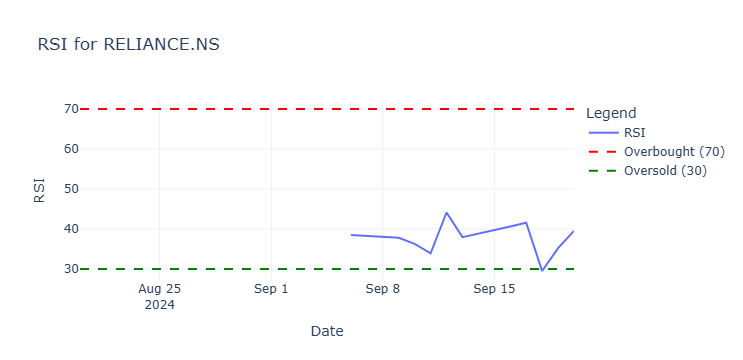

In [47]:
# Relative Strength Index (RSI)
# Relative Strength Index (RSI) is a momentum oscillator that measures the speed and change of price movements, ranging from 0 to 100.
# It helps identify overbought (RSI > 70) or oversold (RSI < 30) conditions in a stock, to signal potential buy or sell opportunities.

# RSI calculation function
def calculate_rsi(prices, window=14):  # window=14: The number of periods to use for calculating RSI (default is 14 days, as per standard RSI).
    delta = prices.diff() #prices.diff() calculates the difference between consecutive prices.If today's price is higher than yesterday's, the result is positive;
    gain = (delta.where(delta > 0, 0)).rolling(window=window).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=window).mean()
    rs = gain / loss #  Relative Strength (RS)
    rsi = 100 - (100 / (1 + rs)) #Relative Strength Index (RSI)
    return rsi

# calculate RSI for RELIANCE
nifty50_data['RELIANCE_RSI'] = calculate_rsi(nifty50_data['RELIANCE.NS'])

fig = go.Figure() #RSI line

fig.add_trace(go.Scatter(
    x=nifty50_data['Date'],
    y=nifty50_data['RELIANCE_RSI'],
    mode='lines',
    name='RSI'
))

fig.add_trace(go.Scatter(
    x=nifty50_data['Date'],
    y=[70] * len(nifty50_data['Date']),
    mode='lines',
    line=dict(color='red', dash='dash'),
    name='Overbought (70)'
))

fig.add_trace(go.Scatter(
    x=nifty50_data['Date'],
    y=[30] * len(nifty50_data['Date']),
    mode='lines',
    line=dict(color='green', dash='dash'),
    name='Oversold (30)'
))

fig.update_layout(
    title="RSI for RELIANCE.NS",
    xaxis_title="Date",
    yaxis_title="RSI",
    template="plotly_white",
    legend=dict(title="Legend")
)

fig.show()


#So, in the above code, we:

# Used a 14-day window to compute RSI for RELIANCE, based on average gains and losses over that period.
# Plotted the RSI values along with horizontal lines at 70 (overbought threshold) and 30 (oversold threshold) to indicate key trading signals.


In [ ]:
# In the above output, the RSI values range between 30 (oversold, green dashed line) and 70 (overbought, red dashed line).
# In the observed period, the RSI remains mostly below 50, which indicates weaker momentum and no overbought conditions. Around mid-September, the RSI briefly drops close to the oversold region, which signals potential buying opportunities before recovering.

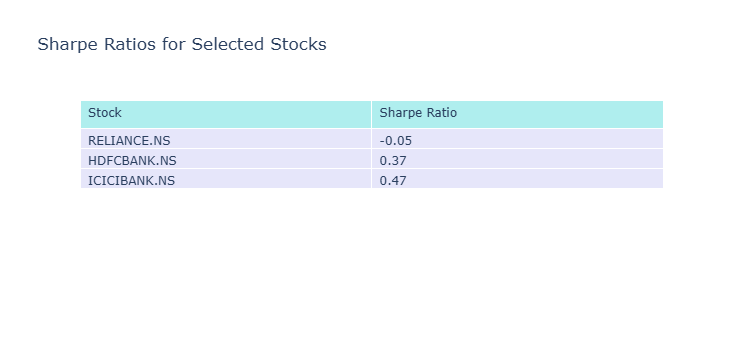

In [49]:
# Sharpe Ratio
# Sharpe Ratio is a measure of risk-adjusted return that indicates how much excess return an investment generates for each unit of risk taken.
# It is calculated by subtracting the risk-free rate from the mean returns and dividing the result by the investment’s volatility (standard deviation).
import numpy as np

# calculate average returns and volatility
mean_returns = daily_returns.mean() #finds the average daily return for each stock.
volatility = daily_returns.std()    #finds the standard deviation of daily returns (how much it fluctuates = volatility).

# assume a risk-free rate
risk_free_rate = 0.04 / 252

# calculate sharpe ratio
sharpe_ratios = (mean_returns - risk_free_rate) / volatility

table_data = pd.DataFrame({
    'Stock': sharpe_ratios.index,
    'Sharpe Ratio': sharpe_ratios.values.round(2) # Rounds Sharpe Ratios to 2 decimal places.
})

fig = go.Figure(data=[go.Table(
    header=dict(values=['Stock', 'Sharpe Ratio'],
                fill_color='paleturquoise',
                align='left'),
    cells=dict(values=[table_data['Stock'], table_data['Sharpe Ratio']],
               fill_color='lavender',
               align='left')
)])

fig.update_layout(
    title="Sharpe Ratios for Selected Stocks",
    template="plotly_white"
)

fig.show()

# In the above code, we:
# Calculated the average daily returns and volatility for the selected stocks.
# Assumed a daily risk-free rate (e.g., 0.04/252 for annualized rate).
# Computed the ratio using the formula (Mean Returns − Risk-Free Rate) / Volatility.
# Displayed the Sharpe Ratios in a tabular format using Plotly.


In [ ]:
#The results show the Sharpe Ratios for the selected stocks:
# RELIANCE.NS: A negative Sharpe Ratio (-0.05) suggests that the stock’s returns are lower than the risk-free rate, which makes it less attractive from a risk-adjusted perspective.
# HDFCBANK.NS: A Sharpe Ratio of 0.37 indicates moderate risk-adjusted returns.
# ICICIBANK.NS: With a Sharpe Ratio of 0.47, it provides the best risk-adjusted returns among the three stocks.

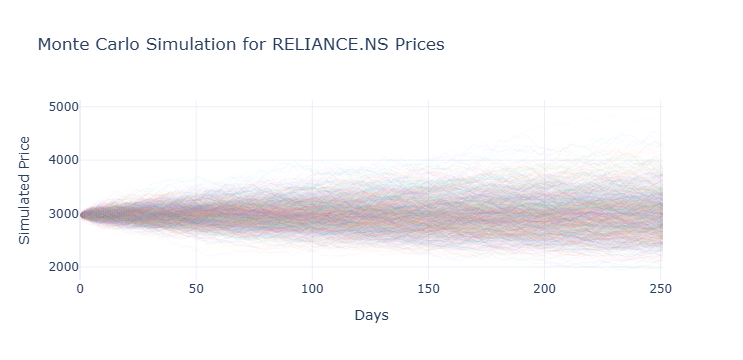

In [51]:
# Monte Carlo Simulation
# Monte Carlo Simulation is a statistical method used to model and predict the probability of different outcomes by running multiple simulations of random variables.
# It is commonly used in finance to estimate potential future price movements of stocks under uncertainty.

# monte carlo simulation for RELIANCE
num_simulations = 1000 #You are going to run 1000 different possible price paths for Reliance’s stock.
num_days = 252
last_price = nifty50_data['RELIANCE.NS'].iloc[-1]
simulated_prices = np.zeros((num_simulations, num_days)) #Creates an empty matrix of shape (1000 simulations × 252 days).
volatility = nifty50_data['RELIANCE.NS'].pct_change().std() # Calculates daily volatility from historical prices using the standard deviation of daily returns.

for i in range(num_simulations):
    simulated_prices[i, 0] = last_price
    for j in range(1, num_days):
        simulated_prices[i, j] = simulated_prices[i, j - 1] * np.exp(
            np.random.normal(0, volatility)
        )

fig = go.Figure()

for i in range(num_simulations):
    fig.add_trace(go.Scatter(
        x=list(range(num_days)),
        y=simulated_prices[i],
        mode='lines',
        line=dict(width=0.5),
        opacity=0.1,
        showlegend=False
    ))

fig.update_layout(
    title="Monte Carlo Simulation for RELIANCE.NS Prices",
    xaxis_title="Days",
    yaxis_title="Simulated Price",
    template="plotly_white"
)

fig.show()

# Generated 1,000 possible price paths for RELIANCE.NS over 252 trading days using its historical volatility.
# Used normally distributed random returns to simulate how the stock price might evolve from its last observed value.
# Plotted all simulation paths to visualize the range of potential future prices.


In [ ]:
# In the above output, each line represents a possible future price trajectory, starting from the last observed price. The spread of the paths widens over time, which reflects increasing uncertainty as the prediction horizon extends. 
# This visualization highlights the range of possible price outcomes, which helps assess risk and the likelihood of extreme scenarios for the stock.
